In [ ]:
import sys, os

root_path = os.path.abspath(os.path.join(os.getcwd(), ".."))
if root_path not in sys.path:
    sys.path.append(root_path)

In [ ]:
from src.data.load_tinyimagenet import *

train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)

---

In [ ]:

from src.Model_A_OutGridNet import * 
from src.stage_config import *

from src.training.one_epoch_train import *
from src.training.train_full_model import *


def imagenet200_stages_t4(drop_path=0.08):
    # resoluciones: 64 -> 32 -> 16 -> 8
    return [
        StageCfg(dim=64,  depth=2, num_heads=2,  grid_size=8, outlook_heads=2,  drop_path=drop_path),
        StageCfg(dim=128, depth=3, num_heads=4,  grid_size=8, outlook_heads=4,  drop_path=drop_path),
        StageCfg(dim=256, depth=4, num_heads=8,  grid_size=4, outlook_heads=8,  drop_path=drop_path),
        StageCfg(dim=384, depth=2, num_heads=6,  grid_size=2, outlook_heads=6,  drop_path=drop_path),]

stages = imagenet200_stages_t4(drop_path=0.1)

model = MaxOutNet(
    num_classes=200,
    stages=stages,
    stem_dim=64,
    dpr_max=0.11)

device = "cuda" if torch.cuda.is_available() else "cpu"

In [29]:
def count_trainable_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

n_params = count_trainable_parameters(model)
print(f"Trainable parameters: {n_params:,}")

Trainable parameters: 22,542,628


In [ ]:
load_checkpoint('/content/Model_A_tinyimagenet_50epocs.pt' , model=model)

In [31]:
evaluate_one_epoch(model=model, dataloader=test_loader)

(1.2630521028518678, {'top1': 69.86, 'top3': 83.59, 'top5': 88.03})

---

# Visualizaciones


==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


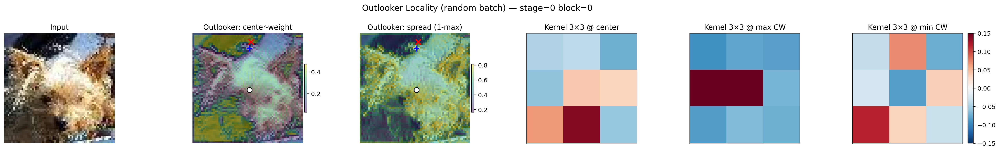

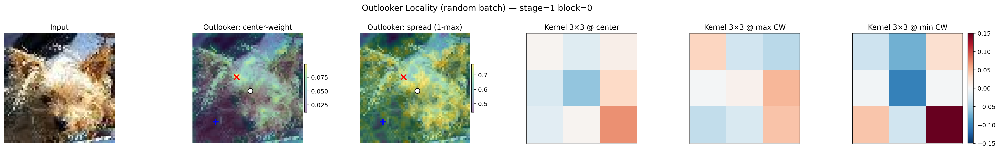

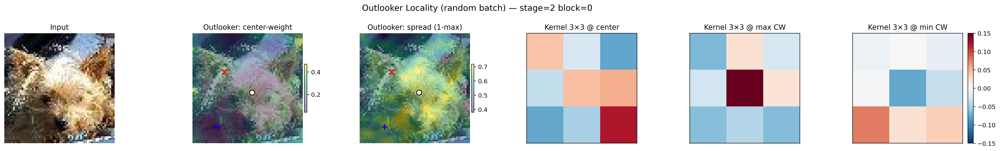

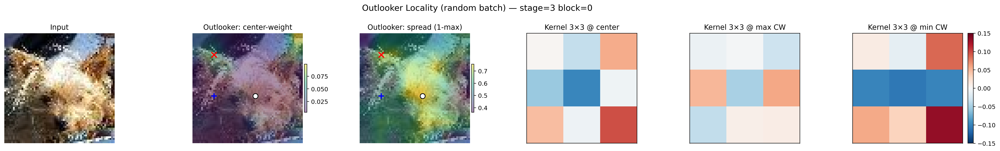

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block0_random.png
CAMBIANDO DE PATCH

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


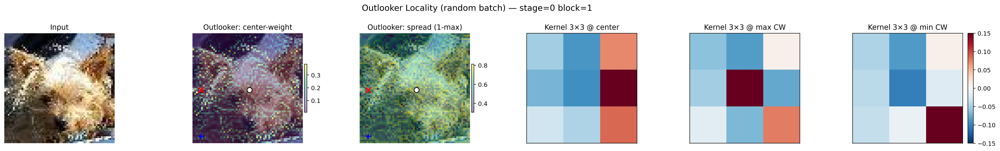

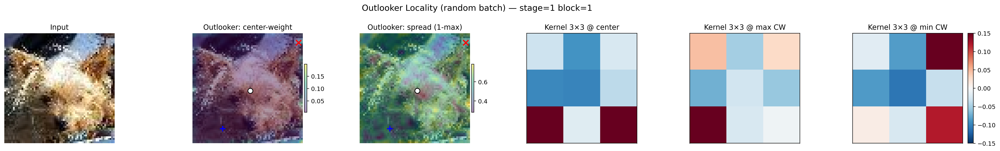

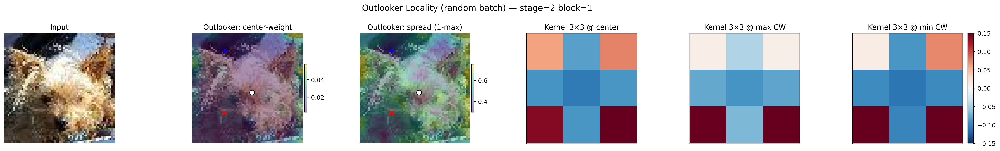

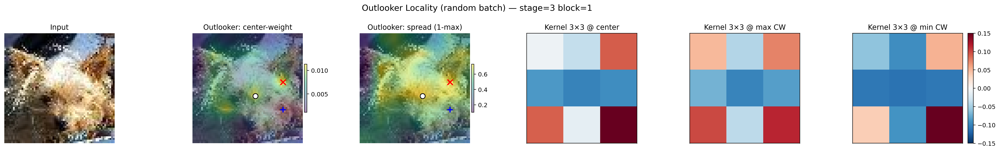

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block1_random.png
CAMBIANDO DE PATCH

==================== block_idx = 2 ====================
Valid stages: (1, 2)


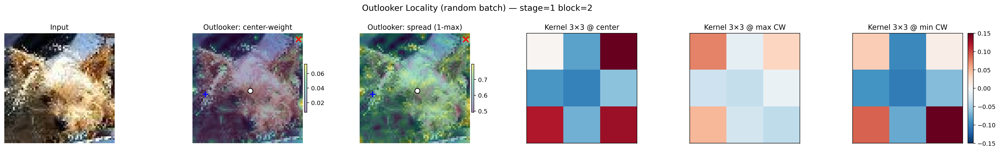

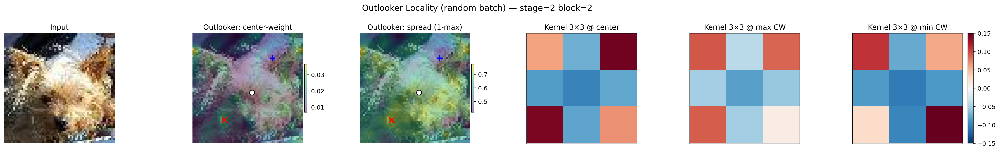

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage1_block2_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block2_random.png
CAMBIANDO DE PATCH

==================== block_idx = 3 ====================
Valid stages: (2,)


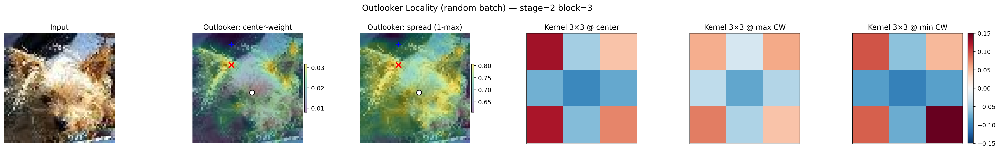

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage2_block3_random.png
CAMBIANDO DE PATCH

TOTAL saved: 11


In [ ]:
import numpy as np

from src.experiments.heat_map_att_grid import * 
from src.experiments.heat_map_att_outlooker import *


stage_depths = (2, 3, 4, 2) 

all_paths = []
for b in [0, 1, 2, 3]:
    print(f"\n==================== block_idx = {b} ====================")
    valid_stages = tuple(s for s in (0, 1, 2, 3) if b < stage_depths[s])
    print("Valid stages:", valid_stages)

    paths = plot_outlooker_locality_random(
        model=model,
        loader=test_loader,
        device="cuda",
        n_images=1,
        stages=valid_stages,
        block_idx=b,
        seed=8888,
        show=True)

    all_paths.extend(paths)
    print("CAMBIANDO DE PATCH")

print("\nTOTAL saved:", len(all_paths))


==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


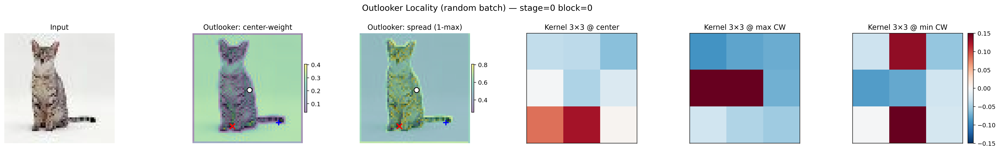

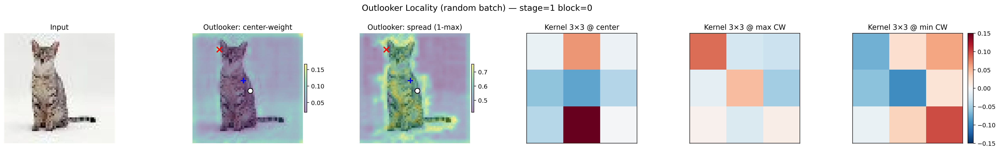

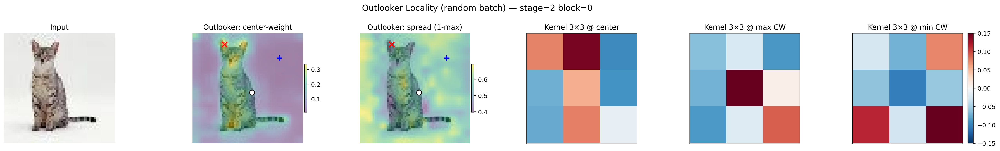

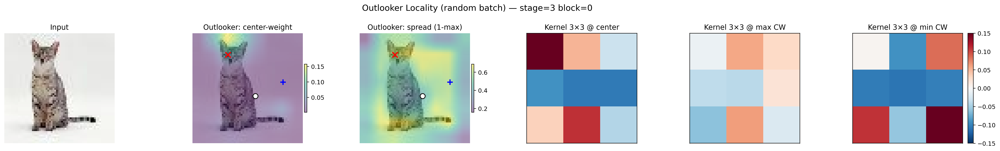

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block0_random.png
CAMBIANDO DE PATCH

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


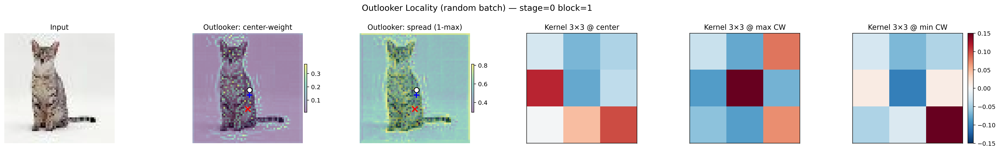

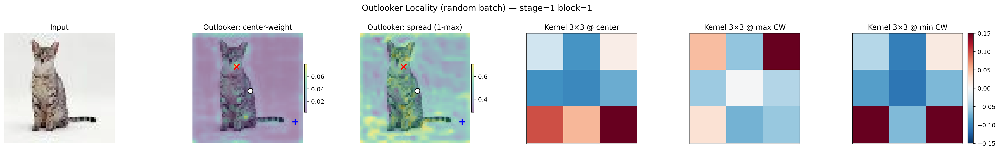

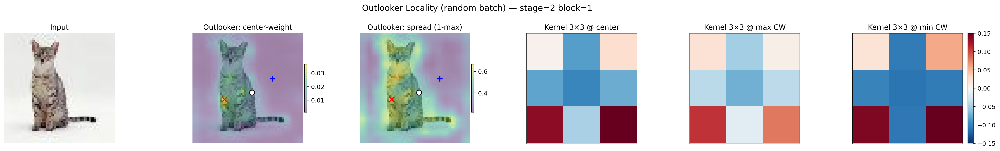

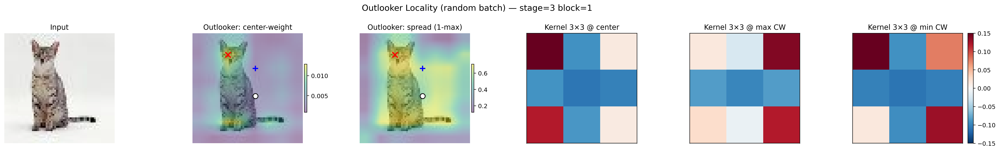

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block1_random.png
CAMBIANDO DE PATCH

==================== block_idx = 2 ====================
Valid stages: (1, 2)


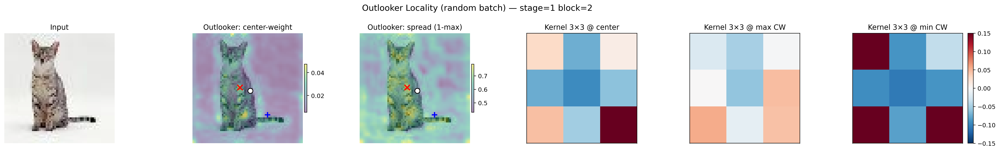

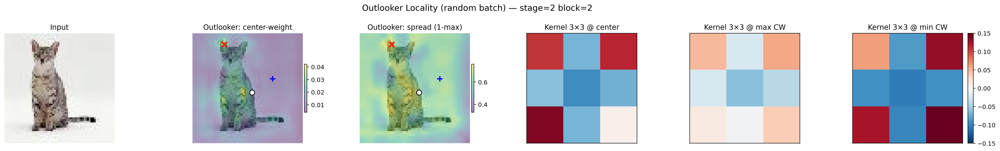

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage1_block2_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block2_random.png
CAMBIANDO DE PATCH

==================== block_idx = 3 ====================
Valid stages: (2,)


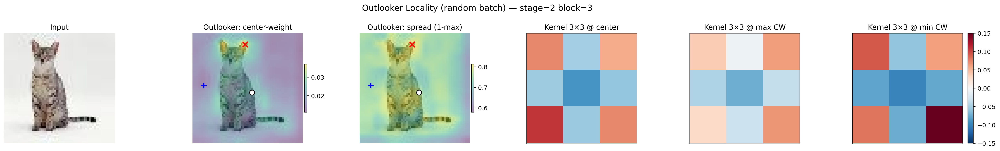

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage2_block3_random.png
CAMBIANDO DE PATCH

TOTAL saved: 11


In [180]:
train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)

stage_depths = (2, 3, 4, 2)

all_paths = []
for b in [0, 1, 2, 3]:
    print(f"\n==================== block_idx = {b} ====================")
    valid_stages = tuple(s for s in (0, 1, 2, 3) if b < stage_depths[s])
    print("Valid stages:", valid_stages)

    paths = plot_outlooker_locality_random(
        model=model,
        loader=test_loader,
        device="cuda",
        n_images=1,
        stages=valid_stages,
        block_idx=b,
        seed=392229,
        show=True)

    all_paths.extend(paths)
    print("CAMBIANDO DE PATCH")

print("\nTOTAL saved:", len(all_paths))


==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


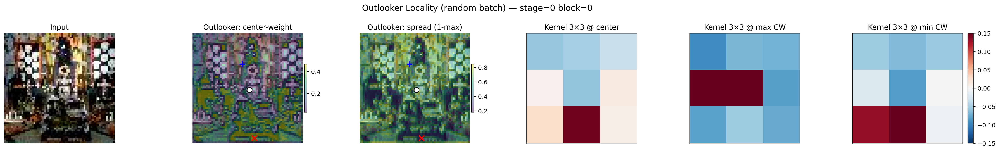

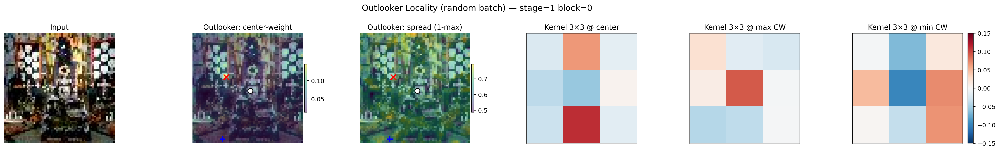

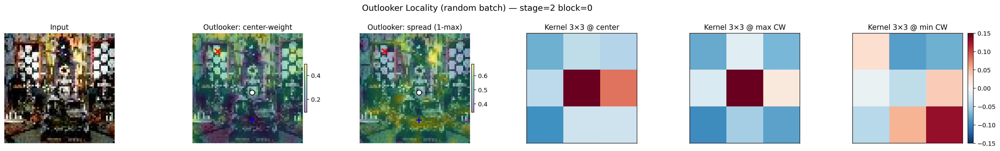

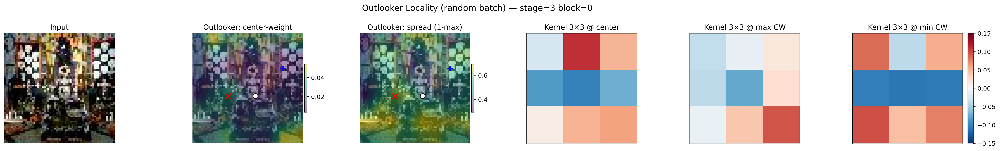

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block0_random.png
CAMBIANDO DE PATCH

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


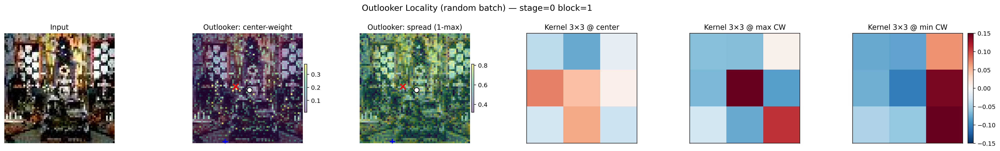

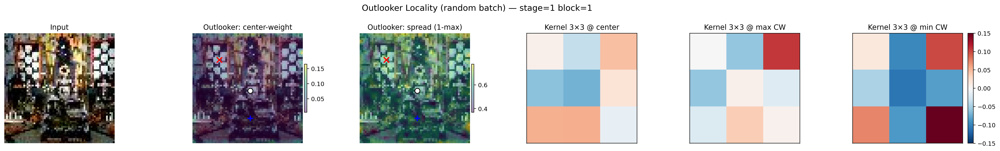

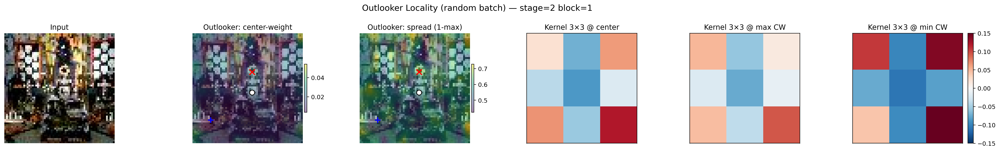

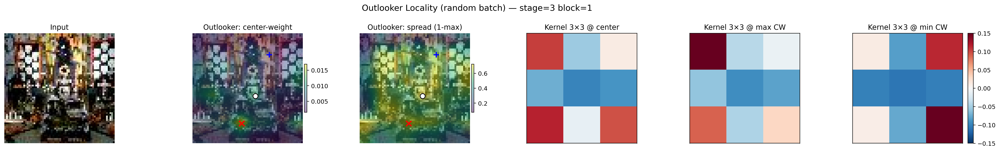

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block1_random.png
CAMBIANDO DE PATCH

==================== block_idx = 2 ====================
Valid stages: (1, 2)


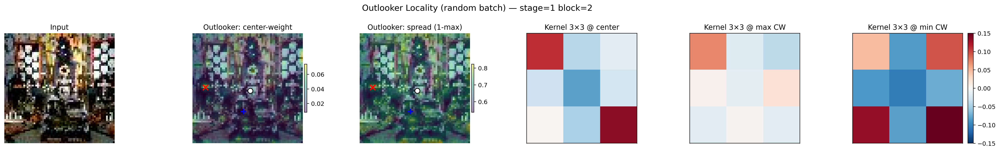

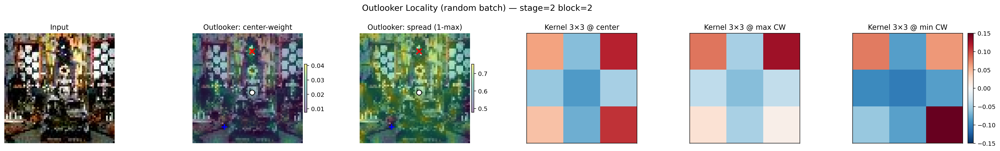

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage1_block2_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block2_random.png
CAMBIANDO DE PATCH

==================== block_idx = 3 ====================
Valid stages: (2,)


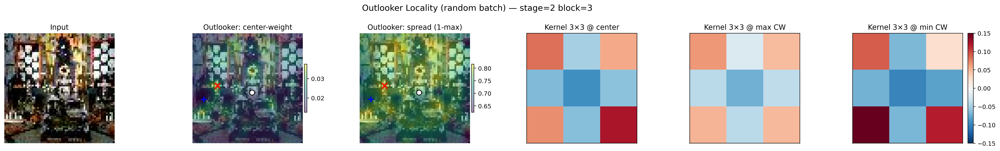

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage2_block3_random.png
CAMBIANDO DE PATCH

TOTAL saved: 11


In [104]:
train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)


stage_depths = (2, 3, 4, 2)

all_paths = []
for b in [0, 1, 2, 3]:
    print(f"\n==================== block_idx = {b} ====================")
    valid_stages = tuple(s for s in (0, 1, 2, 3) if b < stage_depths[s])
    print("Valid stages:", valid_stages)

    paths = plot_outlooker_locality_random(
        model=model,
        loader=test_loader,
        device="cuda",
        n_images=1,
        stages=valid_stages,
        block_idx=b,
        seed=14151,
        show=True)

    all_paths.extend(paths)
    print("CAMBIANDO DE PATCH")

print("\nTOTAL saved:", len(all_paths))


==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


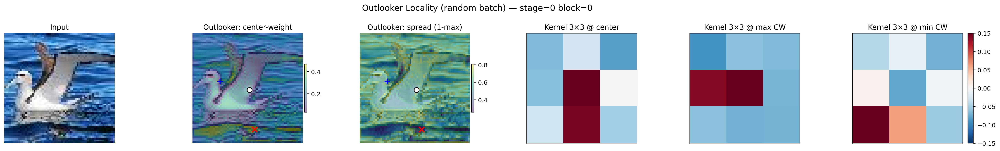

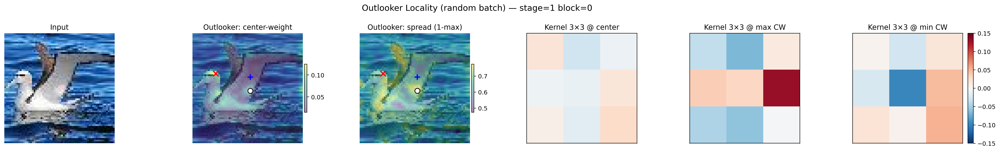

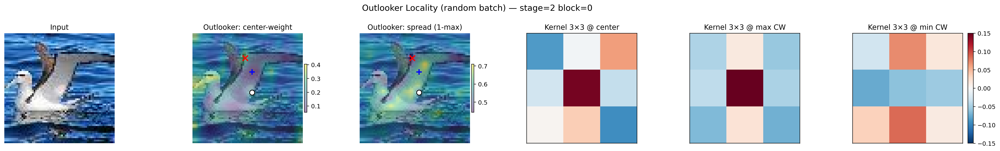

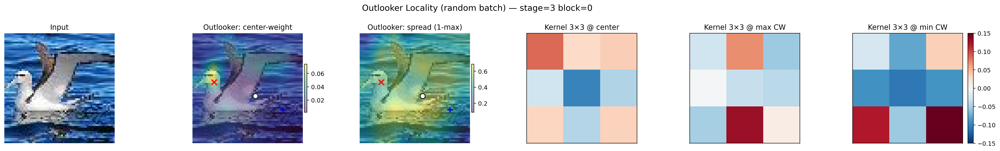

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block0_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block0_random.png
CAMBIANDO DE PATCH

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


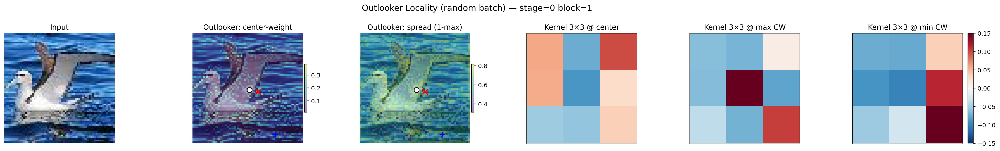

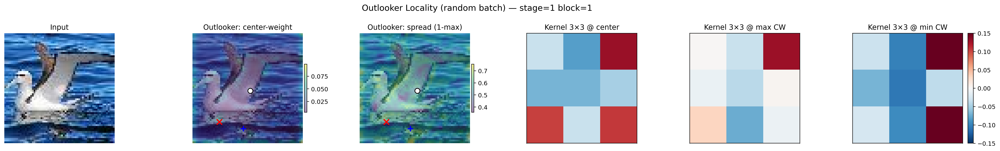

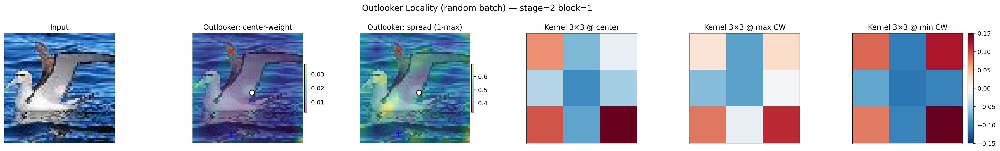

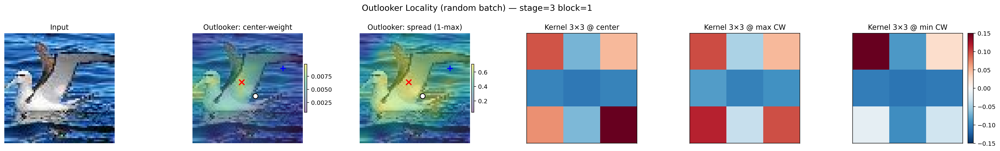

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage0_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage1_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block1_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage3_block1_random.png
CAMBIANDO DE PATCH

==================== block_idx = 2 ====================
Valid stages: (1, 2)


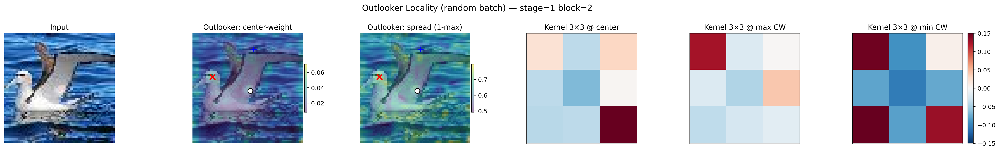

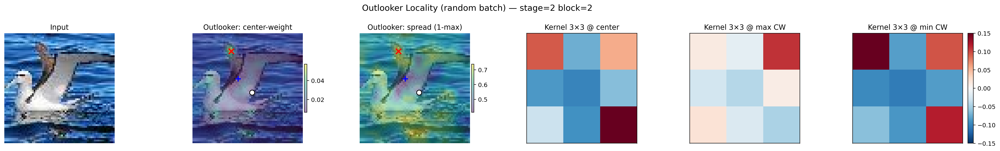

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage1_block2_random.png
 - ./figures/outlooker_locality/outlooker_locality_stage2_block2_random.png
CAMBIANDO DE PATCH

==================== block_idx = 3 ====================
Valid stages: (2,)


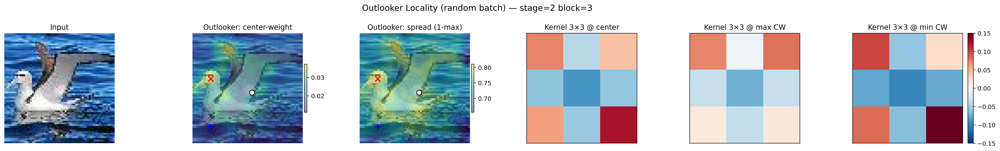

Saved:
 - ./figures/outlooker_locality/outlooker_locality_stage2_block3_random.png
CAMBIANDO DE PATCH

TOTAL saved: 11


In [177]:
train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)


stage_depths = (2, 3, 4, 2)  # stage0..3

all_paths = []
for b in [0, 1, 2, 3]:
    print(f"\n==================== block_idx = {b} ====================")
    valid_stages = tuple(s for s in (0, 1, 2, 3) if b < stage_depths[s])
    print("Valid stages:", valid_stages)

    paths = plot_outlooker_locality_random(
        model=model,
        loader=test_loader,
        device="cuda",
        n_images=1,
        stages=valid_stages,
        block_idx=b,
        seed=911912232222414111,
        show=True)

    all_paths.extend(paths)
    print("CAMBIANDO DE PATCH")

print("\nTOTAL saved:", len(all_paths))

---

## Grid Visualizations 


==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


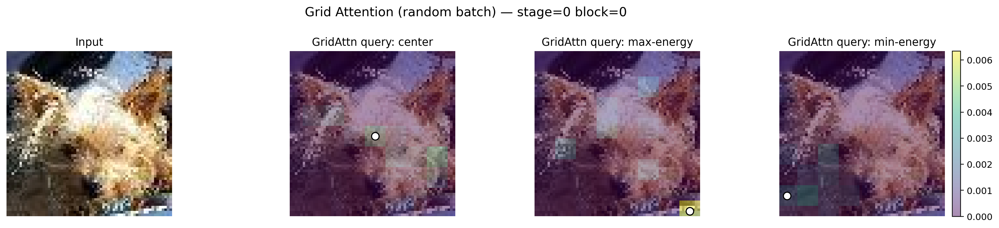

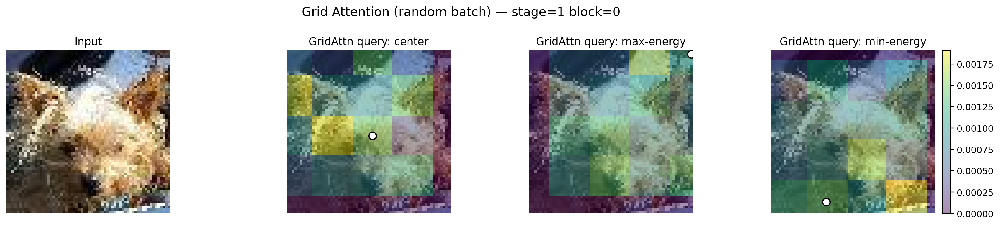

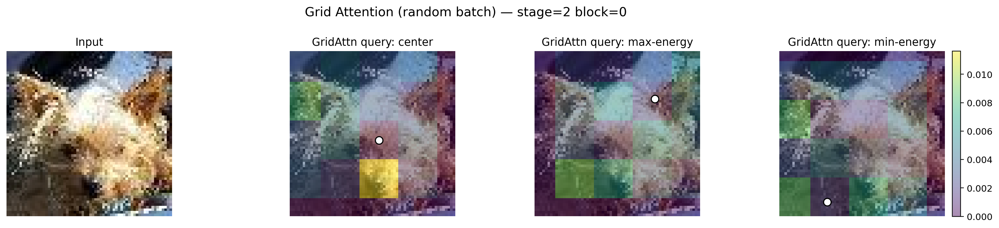

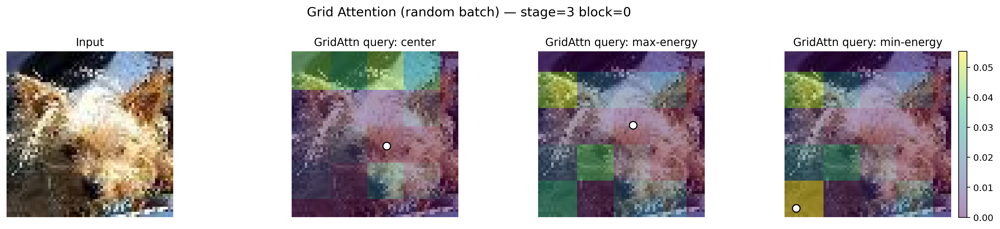

Saved:
 - ./figures/grid_attention/gridattn_stage0_block0_seed8888.png
 - ./figures/grid_attention/gridattn_stage1_block0_seed8888.png
 - ./figures/grid_attention/gridattn_stage2_block0_seed8888.png
 - ./figures/grid_attention/gridattn_stage3_block0_seed8888.png

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


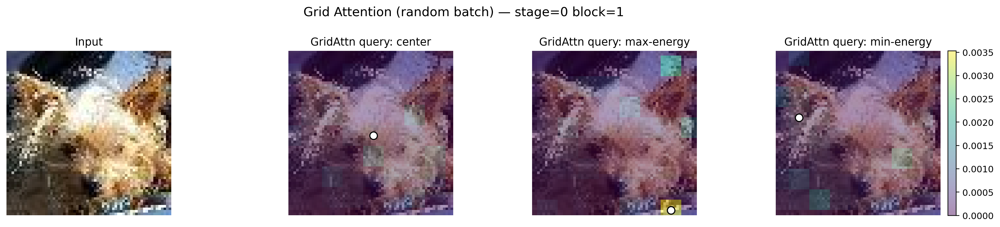

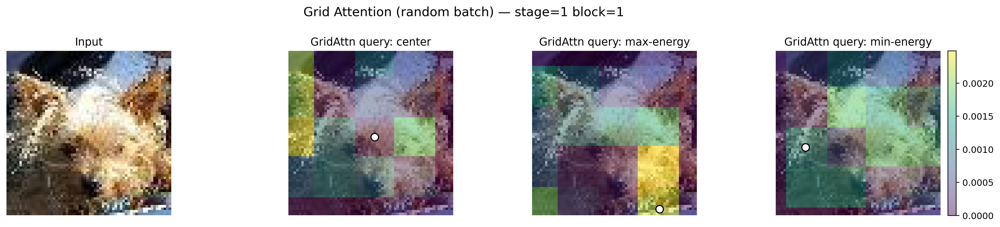

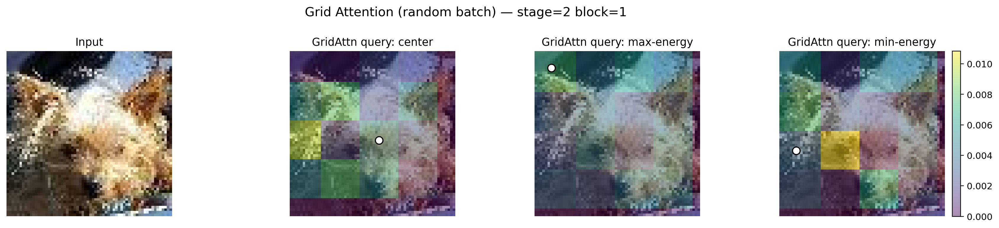

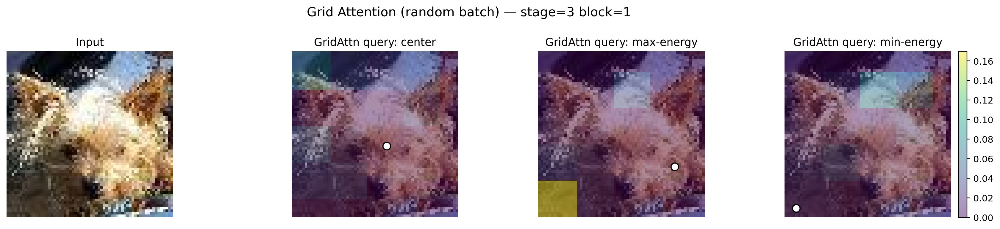

Saved:
 - ./figures/grid_attention/gridattn_stage0_block1_seed8888.png
 - ./figures/grid_attention/gridattn_stage1_block1_seed8888.png
 - ./figures/grid_attention/gridattn_stage2_block1_seed8888.png
 - ./figures/grid_attention/gridattn_stage3_block1_seed8888.png

==================== block_idx = 2 ====================
Valid stages: (1, 2)


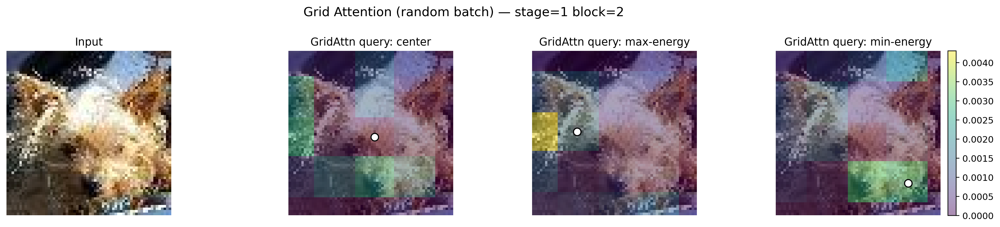

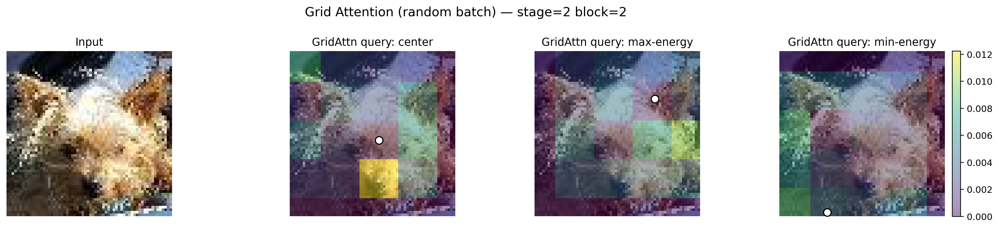

Saved:
 - ./figures/grid_attention/gridattn_stage1_block2_seed8888.png
 - ./figures/grid_attention/gridattn_stage2_block2_seed8888.png

==================== block_idx = 3 ====================
Valid stages: (2,)


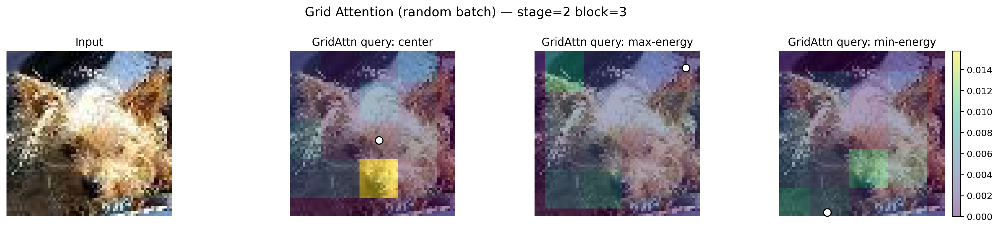

Saved:
 - ./figures/grid_attention/gridattn_stage2_block3_seed8888.png


In [103]:
train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)

stage_depths = [2,3,4,2]

for b in range(max(stage_depths)):
     valid_stages = [s for s,d in enumerate(stage_depths) if b < d]
     print(f"\n==================== block_idx = {b} ====================")
     print("Valid stages:", tuple(valid_stages))

     plot_grid_attention_random(
         model=model, loader=test_loader, device="cuda",
         n_images=1, stages=tuple(valid_stages), block_idx=b,
         stage_depths=stage_depths,
         seed=8888, show=True)


==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


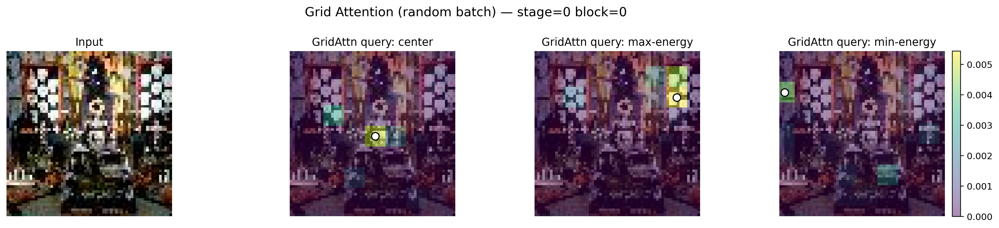

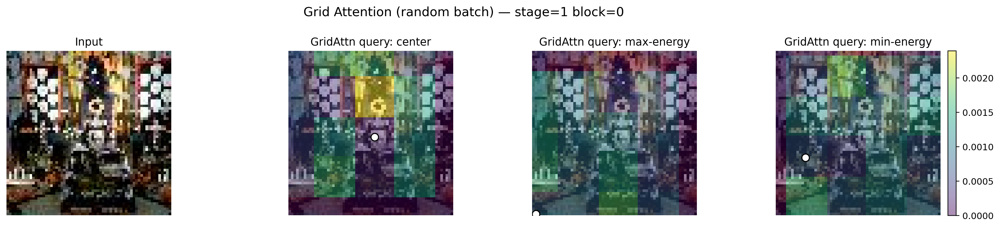

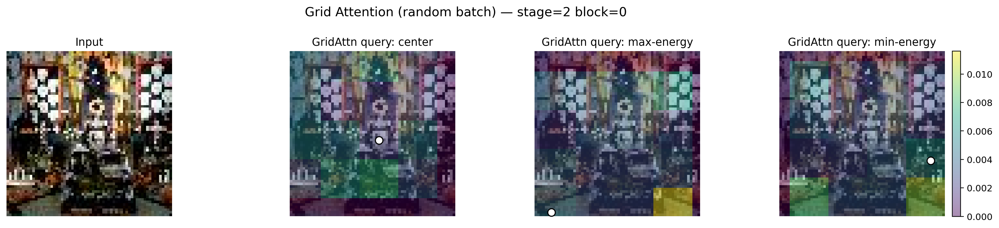

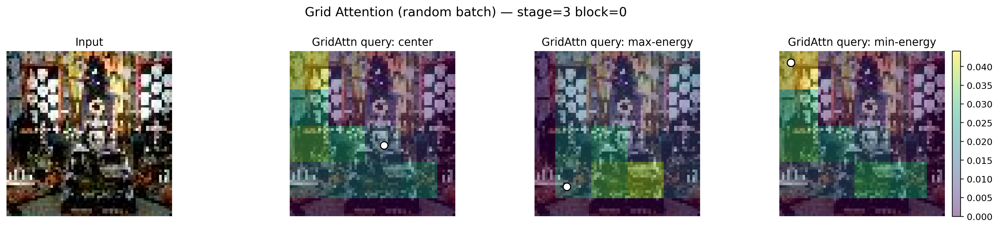

Saved:
 - ./figures/grid_attention/gridattn_stage0_block0_seed14151.png
 - ./figures/grid_attention/gridattn_stage1_block0_seed14151.png
 - ./figures/grid_attention/gridattn_stage2_block0_seed14151.png
 - ./figures/grid_attention/gridattn_stage3_block0_seed14151.png

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


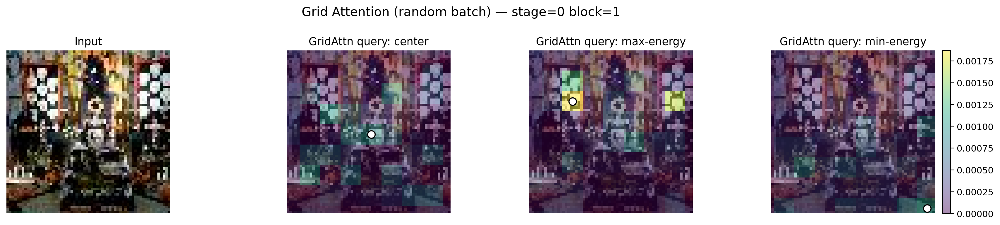

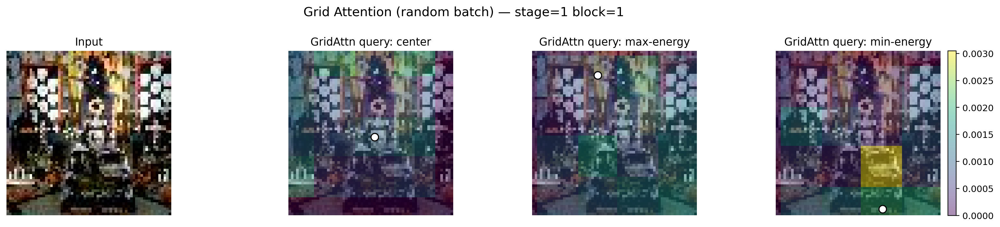

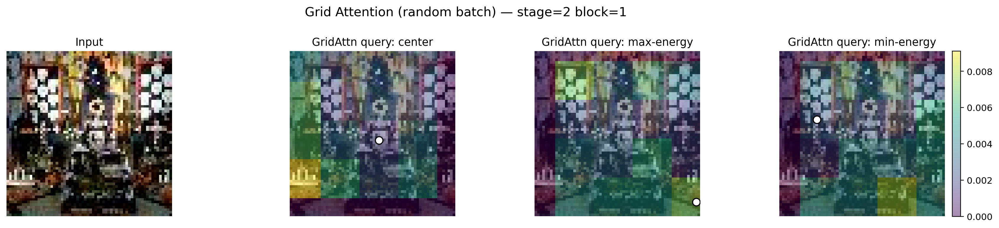

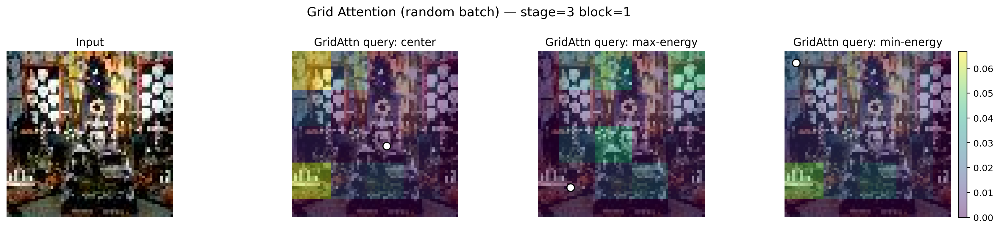

Saved:
 - ./figures/grid_attention/gridattn_stage0_block1_seed14151.png
 - ./figures/grid_attention/gridattn_stage1_block1_seed14151.png
 - ./figures/grid_attention/gridattn_stage2_block1_seed14151.png
 - ./figures/grid_attention/gridattn_stage3_block1_seed14151.png

==================== block_idx = 2 ====================
Valid stages: (1, 2)


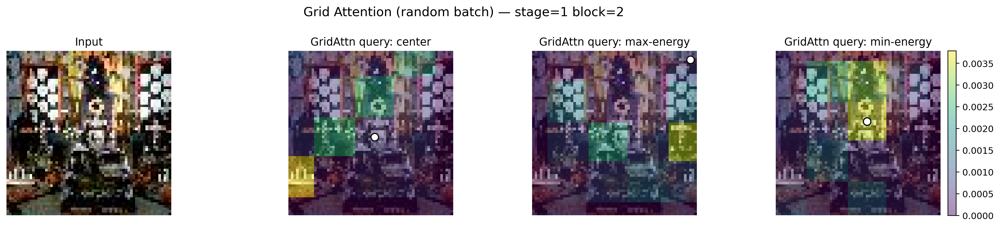

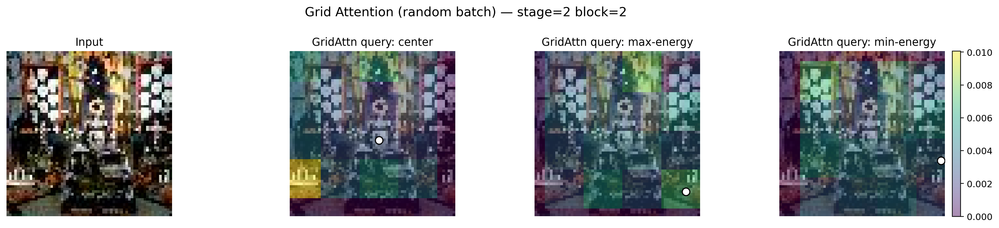

Saved:
 - ./figures/grid_attention/gridattn_stage1_block2_seed14151.png
 - ./figures/grid_attention/gridattn_stage2_block2_seed14151.png

==================== block_idx = 3 ====================
Valid stages: (2,)


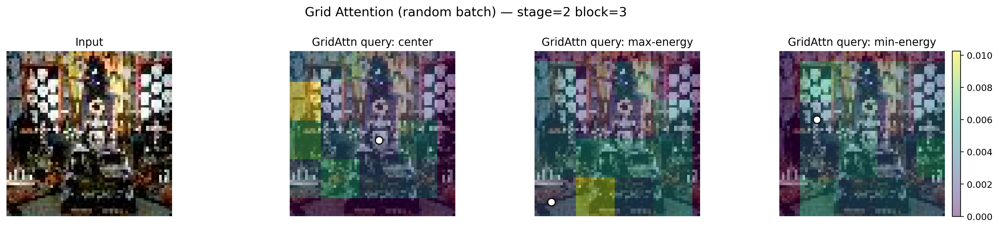

Saved:
 - ./figures/grid_attention/gridattn_stage2_block3_seed14151.png


In [105]:
train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)

stage_depths = [2,3,4,2]

for b in range(max(stage_depths)):
     valid_stages = [s for s,d in enumerate(stage_depths) if b < d]
     print(f"\n==================== block_idx = {b} ====================")
     print("Valid stages:", tuple(valid_stages))

     plot_grid_attention_random(
         model=model, loader=test_loader, device="cuda",
         n_images=1, stages=tuple(valid_stages), block_idx=b,
         stage_depths=stage_depths,
         seed=14151, show=True)


==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


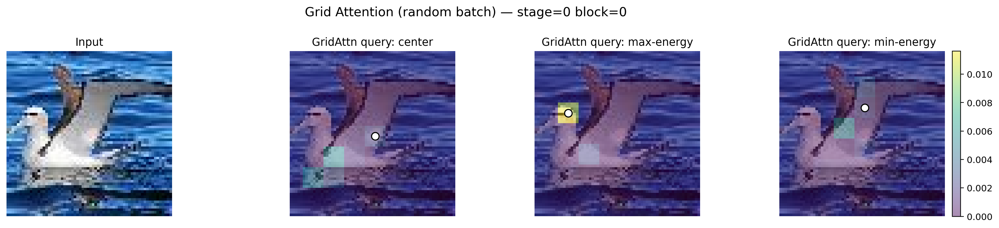

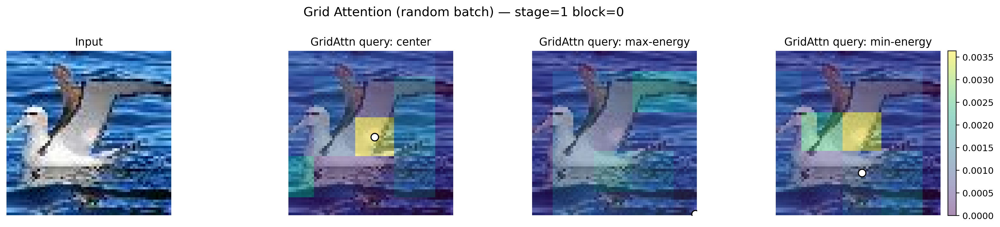

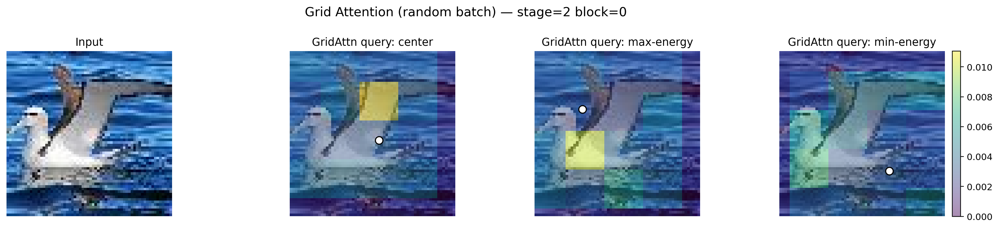

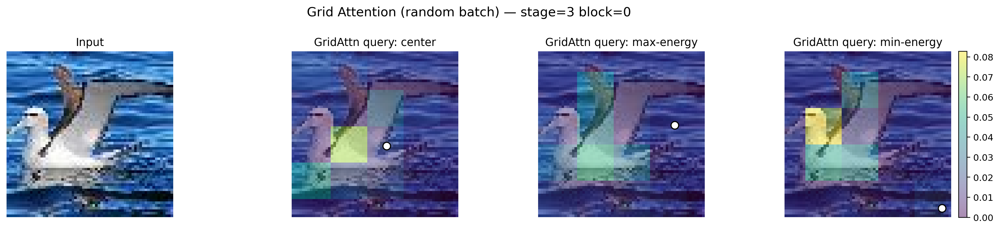

Saved:
 - ./figures/grid_attention/gridattn_stage0_block0_seed911912232222414111.png
 - ./figures/grid_attention/gridattn_stage1_block0_seed911912232222414111.png
 - ./figures/grid_attention/gridattn_stage2_block0_seed911912232222414111.png
 - ./figures/grid_attention/gridattn_stage3_block0_seed911912232222414111.png

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


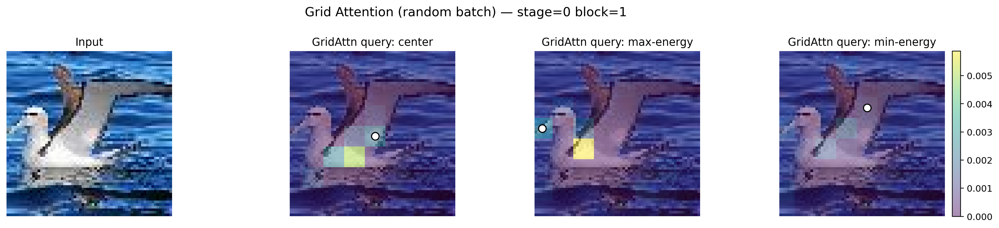

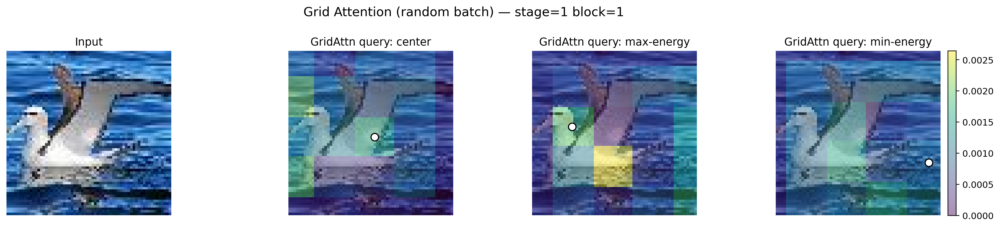

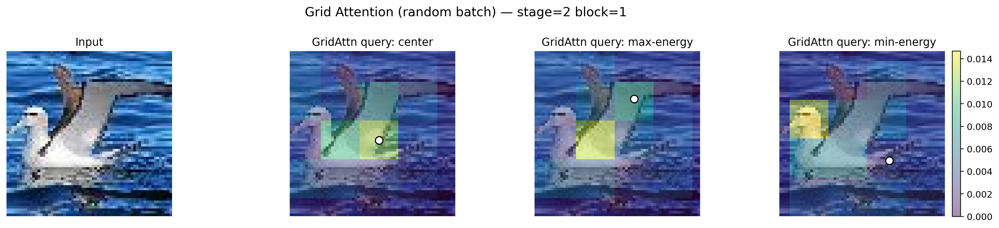

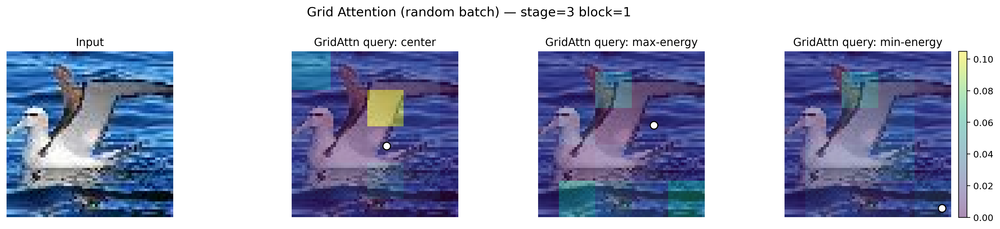

Saved:
 - ./figures/grid_attention/gridattn_stage0_block1_seed911912232222414111.png
 - ./figures/grid_attention/gridattn_stage1_block1_seed911912232222414111.png
 - ./figures/grid_attention/gridattn_stage2_block1_seed911912232222414111.png
 - ./figures/grid_attention/gridattn_stage3_block1_seed911912232222414111.png

==================== block_idx = 2 ====================
Valid stages: (1, 2)


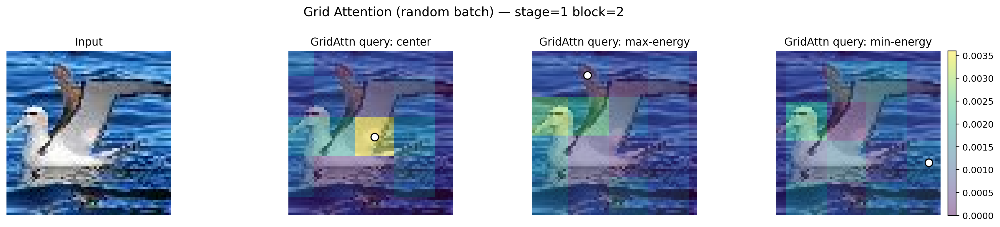

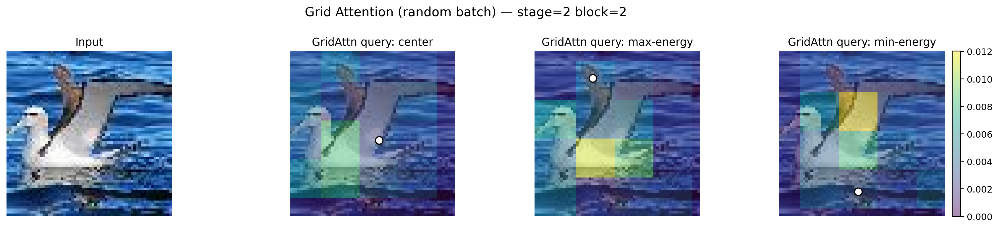

Saved:
 - ./figures/grid_attention/gridattn_stage1_block2_seed911912232222414111.png
 - ./figures/grid_attention/gridattn_stage2_block2_seed911912232222414111.png

==================== block_idx = 3 ====================
Valid stages: (2,)


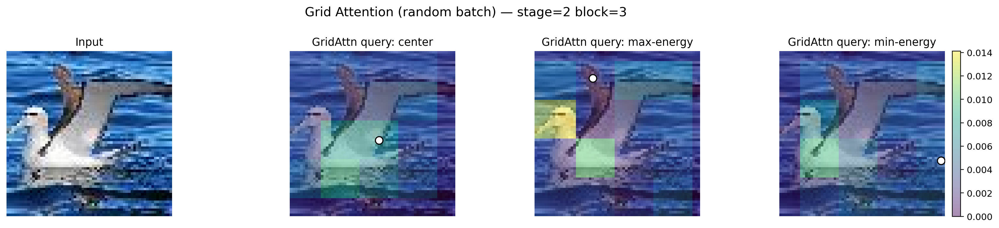

Saved:
 - ./figures/grid_attention/gridattn_stage2_block3_seed911912232222414111.png


In [178]:
train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)

stage_depths = [2,3,4,2]

for b in range(max(stage_depths)):
     valid_stages = [s for s,d in enumerate(stage_depths) if b < d]
     print(f"\n==================== block_idx = {b} ====================")
     print("Valid stages:", tuple(valid_stages))

     plot_grid_attention_random(
         model=model, loader=test_loader, device="cuda",
         n_images=1, stages=tuple(valid_stages), block_idx=b,
         stage_depths=stage_depths,
         seed=911912232222414111, show=True)



==================== block_idx = 0 ====================
Valid stages: (0, 1, 2, 3)


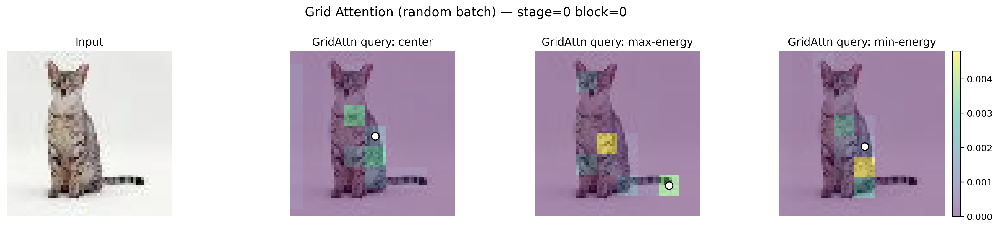

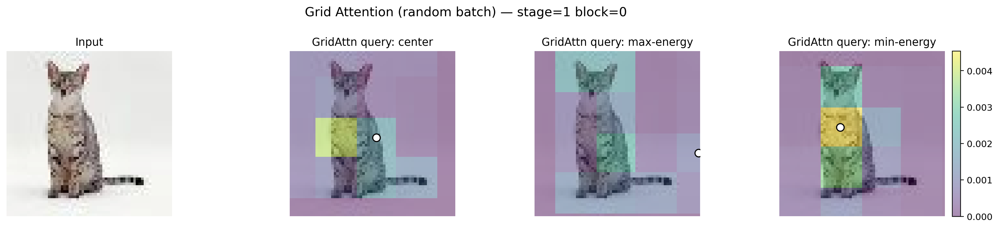

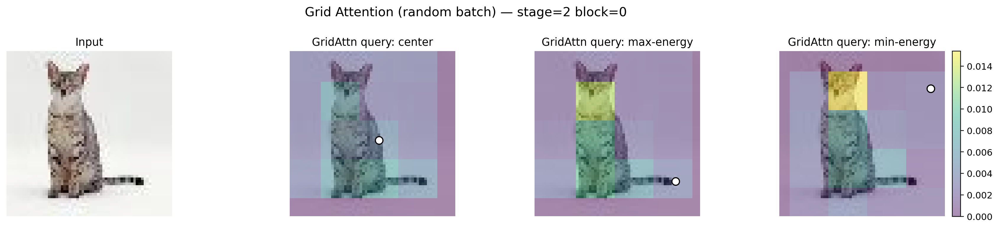

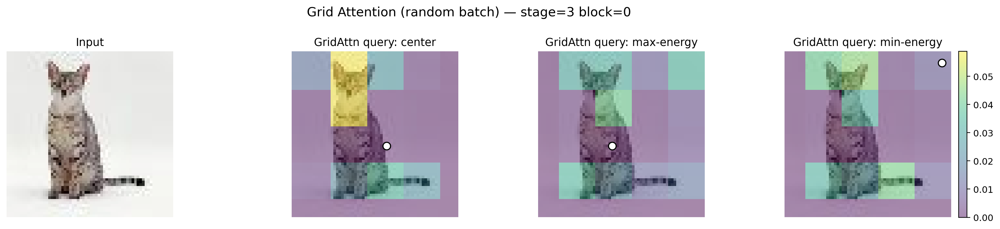

Saved:
 - ./figures/grid_attention/gridattn_stage0_block0_seed392229.png
 - ./figures/grid_attention/gridattn_stage1_block0_seed392229.png
 - ./figures/grid_attention/gridattn_stage2_block0_seed392229.png
 - ./figures/grid_attention/gridattn_stage3_block0_seed392229.png

==================== block_idx = 1 ====================
Valid stages: (0, 1, 2, 3)


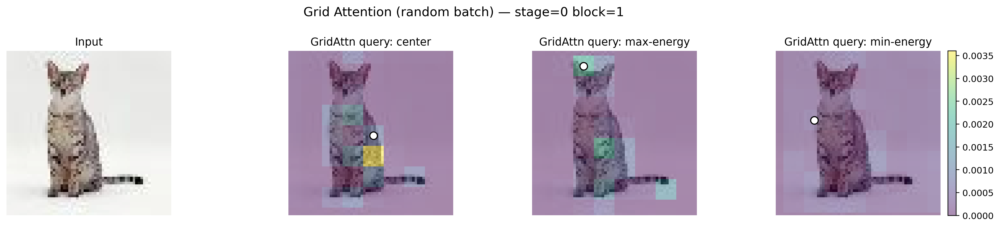

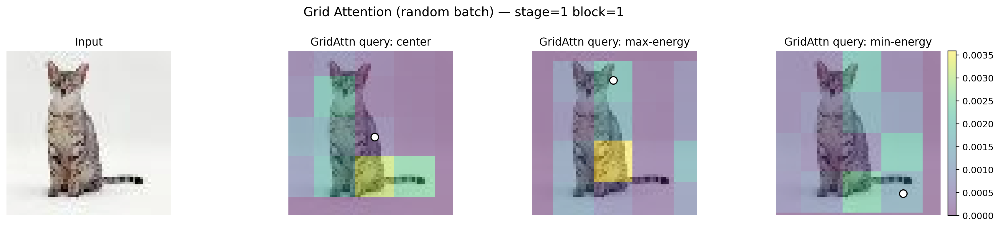

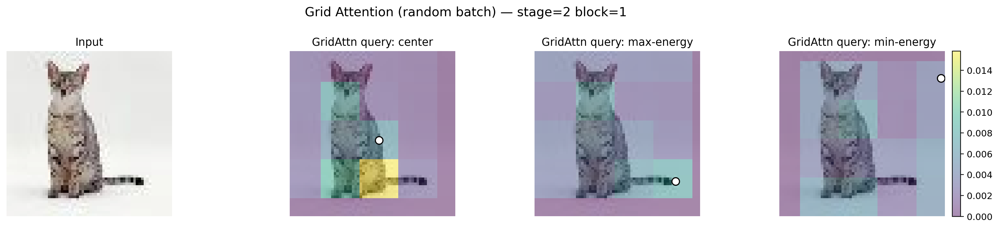

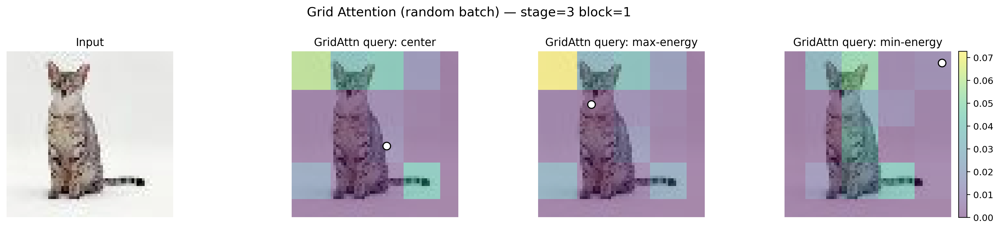

Saved:
 - ./figures/grid_attention/gridattn_stage0_block1_seed392229.png
 - ./figures/grid_attention/gridattn_stage1_block1_seed392229.png
 - ./figures/grid_attention/gridattn_stage2_block1_seed392229.png
 - ./figures/grid_attention/gridattn_stage3_block1_seed392229.png

==================== block_idx = 2 ====================
Valid stages: (1, 2)


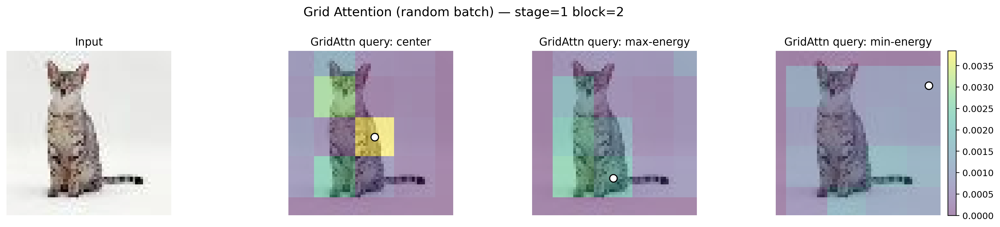

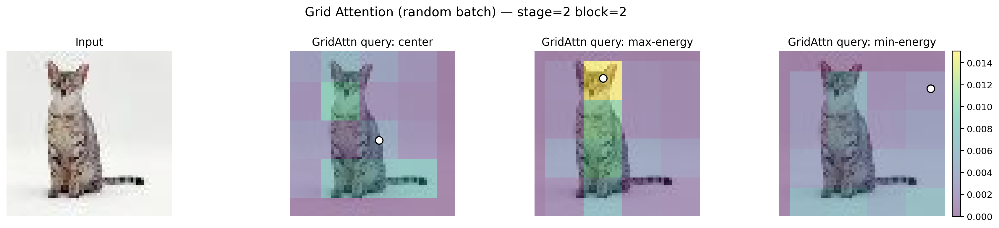

Saved:
 - ./figures/grid_attention/gridattn_stage1_block2_seed392229.png
 - ./figures/grid_attention/gridattn_stage2_block2_seed392229.png

==================== block_idx = 3 ====================
Valid stages: (2,)


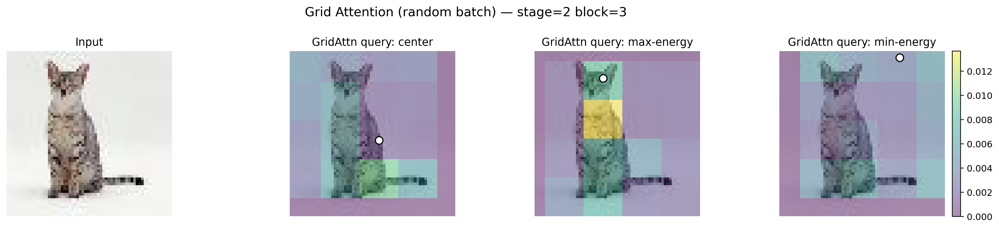

Saved:
 - ./figures/grid_attention/gridattn_stage2_block3_seed392229.png


In [181]:
train_loader, val_loader, test_loader = get_tinyimagenet200_hf_dataloaders(
    batch_size=64,
    data_dir="./data",
    num_workers=2,
    val_split=0.1,
    img_size=64,
    seed=7)

stage_depths = [2,3,4,2]

for b in range(max(stage_depths)):
     valid_stages = [s for s,d in enumerate(stage_depths) if b < d]
     print(f"\n==================== block_idx = {b} ====================")
     print("Valid stages:", tuple(valid_stages))

     plot_grid_attention_random(
         model=model, loader=test_loader, device="cuda",
         n_images=1, stages=tuple(valid_stages), block_idx=b,
         stage_depths=stage_depths,
         seed=392229, show=True)

---